In [97]:
import numpy as npUntitled
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from xgboost import XGBRegressor 
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.offline as py
from sklearn.model_selection import  train_test_split
from sklearn.linear_model import  LogisticRegression
from sklearn.metrics import confusion_matrix , accuracy_score , classification_report
from sklearn.metrics import  roc_auc_score , roc_curve 
from sklearn.metrics import f1_score
import statsmodels.api as sm
from sklearn.metrics import  precision_score ,recall_score
from yellowbrick.classifier import DiscriminationThreshold
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [63]:
df_2 = pd.read_csv("c:/Users/ASUS/Desktop/mlb/sweetstatsless.csv")

In [64]:

df = df_2.copy() # we should always keep a original version of the data set.
df

,player_id,year,b_single,b_double,b_triple,b_home_run,exit_velocity_avg,sweet_spot_percent,barrel_batted_rate,poorlyweak_percent,...,z_swing_percent,z_swing_miss_percent,oz_swing_percent,oz_swing_miss_percent,oz_contact_percent,out_zone_swing_miss,out_zone_swing,out_zone_percent,out_zone,iz_contact_percent
0,405395,2022,14,4,0,4,90.3,29.9,8.0,2.3,...,64.5,10.2,30.2,39.5,60.5,34,86,55.6,285,89.8
1,408234,2022,49,6,0,3,90.3,38.0,6.3,1.4,...,72.3,25.2,30.2,45.8,54.2,55,120,51.2,398,74.8
2,425877,2022,22,5,0,2,87.2,30.1,3.5,4.4,...,75.5,20.4,41.3,29.4,70.6,30,102,49.4,247,79.6
3,429664,2022,10,0,0,1,87.2,32.1,5.7,9.4,...,76.4,13.4,40.9,43.1,56.9,28,65,55.6,159,86.6
4,435559,2022,9,2,0,1,84.4,29.8,2.1,2.1,...,62.7,12.5,21.1,48.4,51.6,15,31,49.0,147,87.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,680911,2022,29,18,0,4,88.1,39.6,3.8,2.5,...,62.7,11.7,34.5,32.9,67.1,50,152,51.8,440,88.3
410,680977,2022,30,14,0,1,87.4,34.2,1.8,3.6,...,57.5,7.5,25.1,31.9,66.0,30,94,53.5,374,91.4
411,681082,2022,14,3,0,4,85.1,29.7,3.3,6.6,...,60.8,19.3,25.2,31.1,68.9,19,61,43.4,242,79.7
412,682928,2022,7,2,0,1,86.6,31.8,4.5,11.4,...,67.0,21.7,40.0,38.0,62.0,19,50,54.8,125,78.3


In [65]:
df.shape

(414, 21)

In [66]:
df['b_home_run']

0      4
1      3
2      2
3      1
4      1
      ..
409    4
410    1
411    4
412    1
413    6
Name: b_home_run, Length: 414, dtype: int64

In [67]:
df.columns

Index(['player_id', 'year', 'b_single', 'b_double', 'b_triple', 'b_home_run',
       'exit_velocity_avg', 'sweet_spot_percent', 'barrel_batted_rate',
       'poorlyweak_percent', 'hard_hit_percent', 'z_swing_percent',
       'z_swing_miss_percent', 'oz_swing_percent', 'oz_swing_miss_percent',
       'oz_contact_percent', 'out_zone_swing_miss', 'out_zone_swing',
       'out_zone_percent', 'out_zone', 'iz_contact_percent'],
      dtype='object')

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   player_id              414 non-null    int64  
 1   year                   414 non-null    int64  
 2   b_single               414 non-null    int64  
 3   b_double               414 non-null    int64  
 4   b_triple               414 non-null    int64  
 5   b_home_run             414 non-null    int64  
 6   exit_velocity_avg      414 non-null    float64
 7   sweet_spot_percent     414 non-null    float64
 8   barrel_batted_rate     414 non-null    float64
 9   poorlyweak_percent     414 non-null    float64
 10  hard_hit_percent       414 non-null    float64
 11  z_swing_percent        414 non-null    float64
 12  z_swing_miss_percent   414 non-null    float64
 13  oz_swing_percent       414 non-null    float64
 14  oz_swing_miss_percent  414 non-null    float64
 15  oz_con

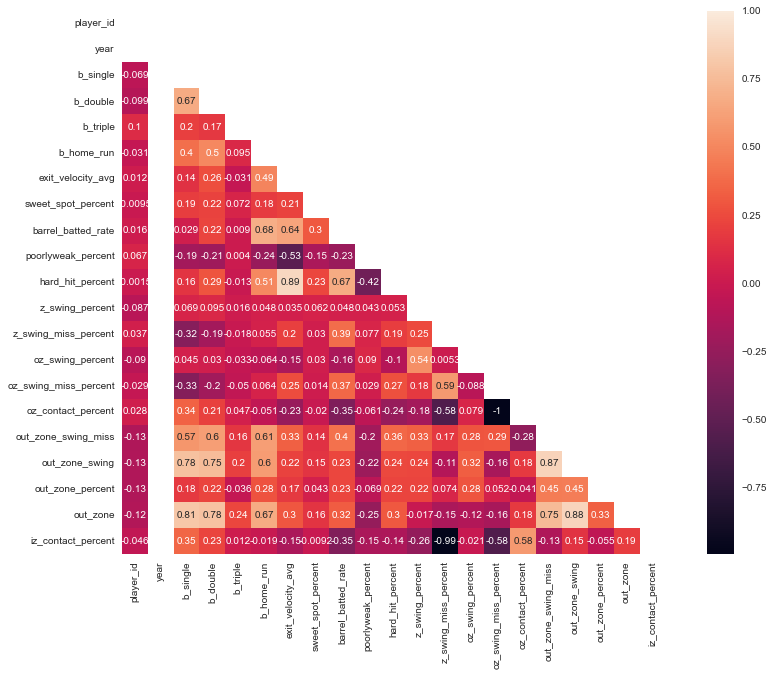

In [69]:
import seaborn as sns
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15,10))
    ax = sns.heatmap(corr,annot=True, mask=mask, vmax=1, square=True)

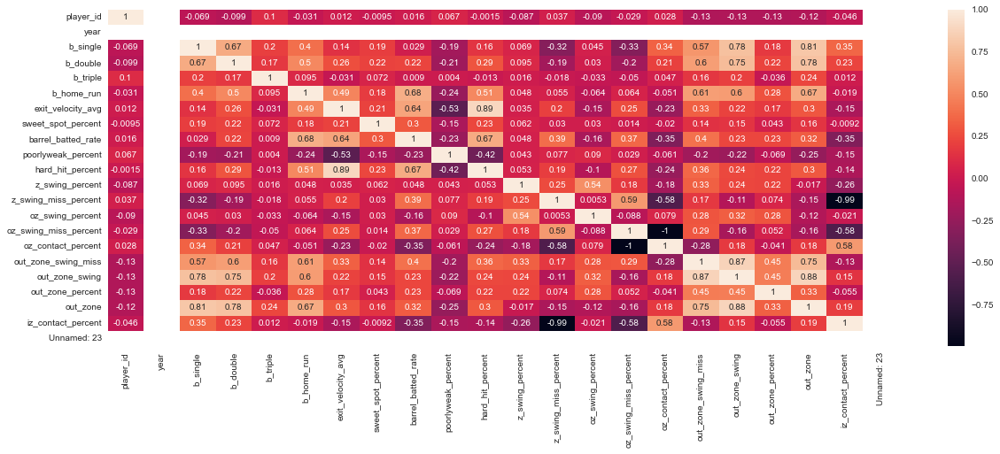

In [36]:
numeric_corr = numerical_data.corr()
plt.figure(figsize = (20,7))
sns.heatmap(numeric_corr, annot = True);

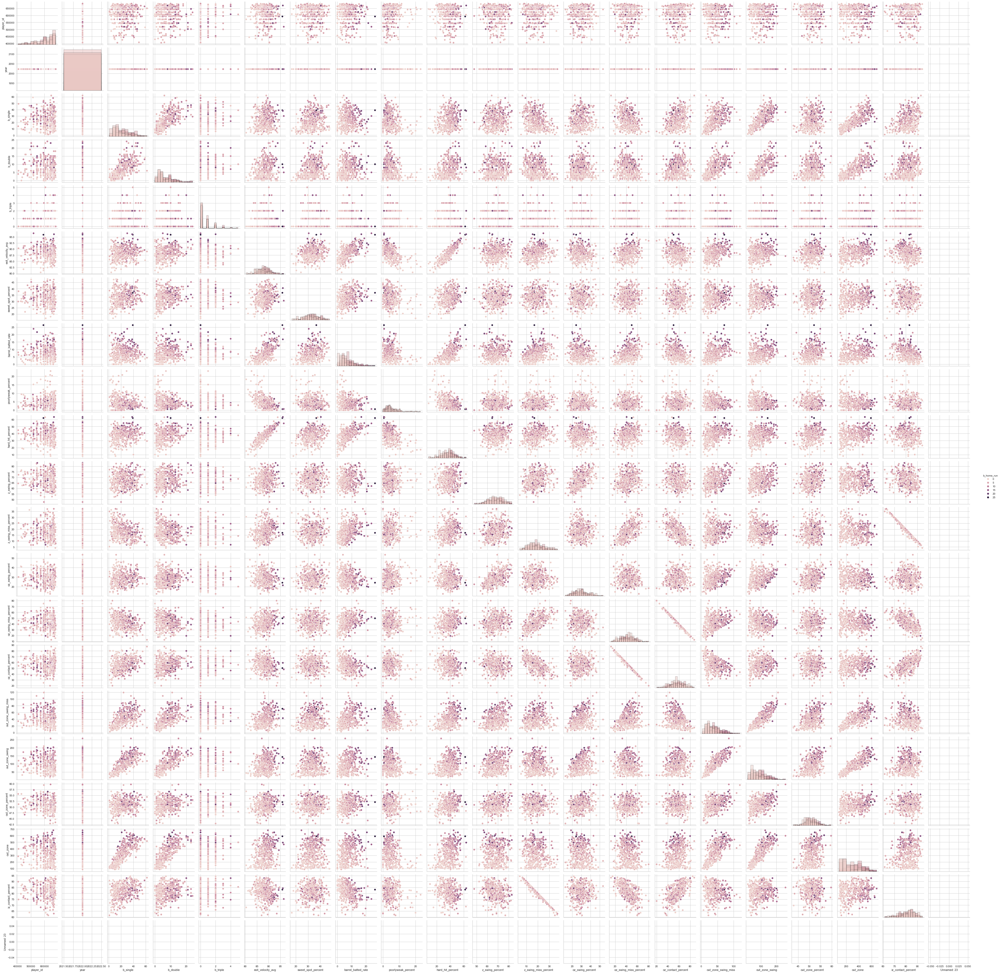

In [37]:
sns.pairplot(df, hue="b_home_run", diag_kind="hist")
plt.show()

In [70]:
lab = df.b_home_run.value_counts().keys().tolist()
values = df.b_home_run.value_counts().values.tolist()
trace = go.Pie(labels = lab , values = values , 
              marker = dict(colors =  [ 'royalblue' ,'lime'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer attrition in data",
                   plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",)
                  )
data = [trace]
fig = go.Figure(data=data , layout=layout)
py.iplot(fig)

In [72]:
Id_col = ['player_id']
target_col = ['b_home_run']

In [73]:
train , test = train_test_split(df , test_size = 0.25 , random_state =42 )
cols = [col for col in df.columns if col not in Id_col + target_col]
train_X =train[cols]
train_Y = train[target_col]
test_X = test[cols]
test_Y = test[target_col]

In [75]:
def select_model_prediction(algorithm,training_x,testing_x,
                             training_y,testing_y,cols,cf,threshold_plot) :
    algorithm.fit(training_x,training_y)
    predictions   = algorithm.predict(testing_x)
    probabilities = algorithm.predict_proba(testing_x)
    #coeffs
    if   cf == "coefficients" :
        coefficients  = pd.DataFrame(algorithm.coef_.ravel())
    elif cf == "features" :
        coefficients  = pd.DataFrame(algorithm.feature_importances_)
        
    column_df     = pd.DataFrame(cols)
    coef_sumry    = (pd.merge(coefficients,column_df,left_index= True,
                              right_index= True, how = "left"))
    coef_sumry.columns = ["coefficients","features"]
    coef_sumry    = coef_sumry.sort_values(by = "coefficients",ascending = False)
    
    print(algorithm)
    print("\n Classification report : \n",classification_report(testing_y,predictions))
    print("Accuracy   Score : ",accuracy_score(testing_y,predictions))
    #confusion matrix
    conf_matrix = confusion_matrix(testing_y,predictions)
    #roc_auc_score
    model_roc_auc = roc_auc_score(testing_y,predictions,multi_class='ovo') 
    print("Area under curve : ",model_roc_auc,"\n")
    fpr,tpr,thresholds = roc_curve(testing_y,probabilities[:,1])
    
    #plot confusion matrix
    trace1 = go.Heatmap(z = conf_matrix ,
                        x = ["low","super"],
                        y = ["low","super"],
                        showscale  = False,colorscale = "Picnic",
                        name = "matrix")
    
    #plot roc curve
    trace2 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2))
    trace3 = go.Scatter(x = [0,1],y=[0,1],
                        line = dict(color = ('rgb(205, 12, 24)'),width = 2,
                        dash = 'dot'))
    
    #plot coeffs
    trace4 = go.Bar(x = coef_sumry["features"],y = coef_sumry["coefficients"],
                    name = "coefficients",
                    marker = dict(color = coef_sumry["coefficients"],
                                  colorscale = "Picnic",
                                  line = dict(width = .6,color = "black")))
    
    #subplots
    fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion Matrix',
                                            'Receiver operating characteristic',
                                            'Feature Importances'))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,1,2)
    fig.append_trace(trace4,2,1)
    
    fig['layout'].update(showlegend=False, title="Model performance" ,
                         autosize = False,height = 900,width = 800,
                         plot_bgcolor = 'rgba(240,240,240, 0.95)',
                         paper_bgcolor = 'rgba(240,240,240, 0.95)',
                         margin = dict(b = 195))
    fig["layout"]["xaxis2"].update(dict(title = "false positive rate"))
    fig["layout"]["yaxis2"].update(dict(title = "true positive rate"))
    fig["layout"]["xaxis3"].update(dict(showgrid = True,tickfont = dict(size = 10),
                                        tickangle = 90))
    py.iplot(fig)
    if threshold_plot == True : 
        visualizer = DiscriminationThreshold(algorithm)
        visualizer.fit(training_x,training_y)
        visualizer.poof()
logit  = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
  intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
  penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
  verbose=0, warm_start=False)
select_model_prediction (logit,train_X,test_X,train_Y,test_Y,
                     cols,"coefficients",threshold_plot = True)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

LogisticRegression(multi_class='ovr', n_jobs=1, solver='liblinear')

 Classification report : 
               precision    recall  f1-score   support

           0       0.33      0.38      0.36        13
           1       0.33      0.14      0.20        14
           2       0.06      0.07      0.06        14
           3       0.19      0.33      0.24         9
           4       0.12      0.17      0.14        12
           5       0.12      0.09      0.11        11
           6       0.00      0.00      0.00         6
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00         5
           9       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         3
          11       0.00      0.00      0.00         2
          12       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         1
          17       0.00      0.00      

AxisError: axis 1 is out of bounds for array of dimension 1

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



IndexError: index 20 is out of bounds for axis 0 with size 20

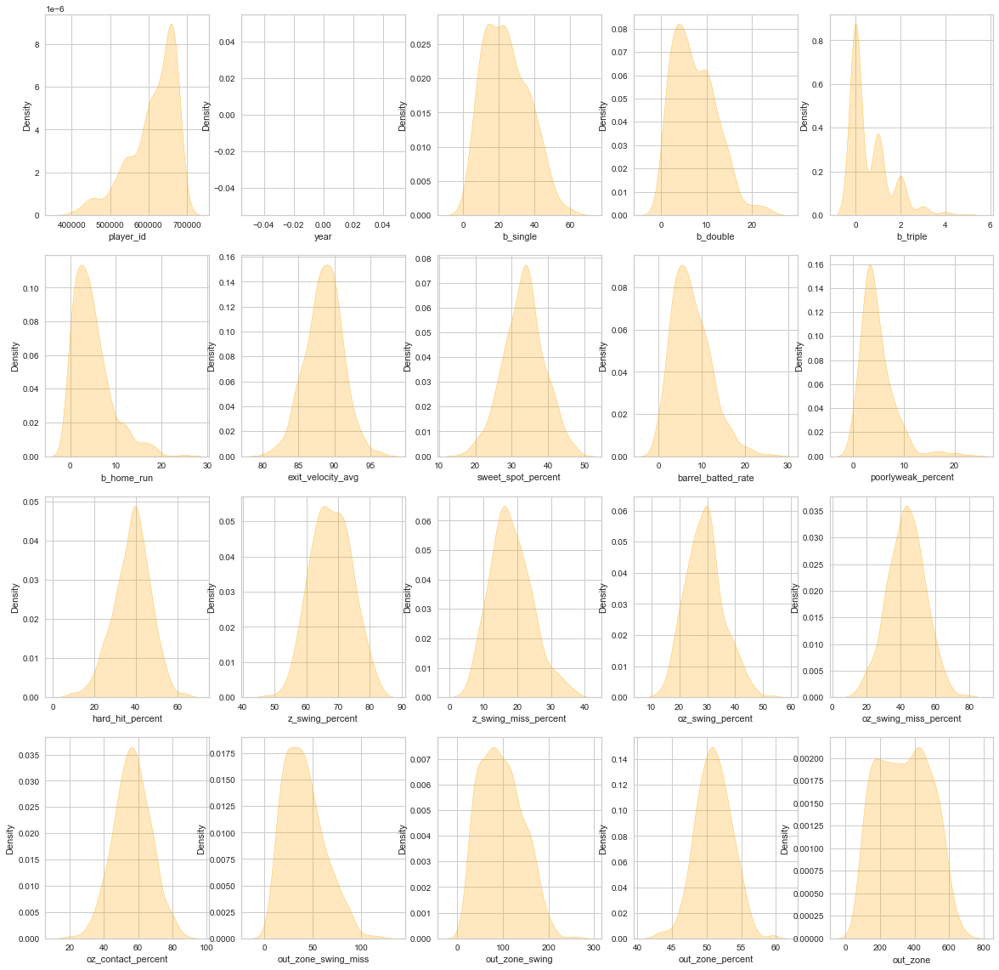

In [92]:
fig, ax = plt.subplots(ncols=5, nrows = 4, figsize = (20,20))
ax = ax.flatten()
index = 0

for col in numerical_data.columns:
    sns.kdeplot(x = df[col], ax= ax[index], fill= True, color = "orange")
    index += 1
fig.tight_layout()

In [98]:
X = df.copy()
y = X.pop("sweet_spot_percent")

# Train and score baseline model
baseline = RandomForestRegressor(criterion="mae", random_state=0)
baseline_score = cross_val_score(
    baseline, X, y, cv=5, scoring="neg_mean_absolute_error"
)
baseline_score = -1 * baseline_score.mean()

print(f"MAE Baseline Score: {baseline_score:.4}")

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:403: FutureWarning:

Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:403: FutureWarning:

Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:403: FutureWarning:

Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:403: FutureWarning:

Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:403: FutureWarning:

Criterion 'mae' was depre

MAE Baseline Score: 4.189


In [123]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
X = df.copy()
y = X.pop("sweet_spot_percent")
tree = DecisionTreeClassifier()
#通過每個估計器擬合80％的訓練點
bag = BaggingClassifier(tree, n_estimators=100, max_samples=0.8,
                        random_state=1)

bag.fit(X, y.astype('int'))
rf_cv_score=cross_val_score(estimator=tree,X=X,y=y.astype('int'),cv=5)
print(rf_cv_score)

[0.07228916 0.02409639 0.10843373 0.03614458 0.01219512]


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



In [124]:
X = df.copy()
y = X.pop("sweet_spot_percent")

# Label encoding for categoricals
for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

# All discrete features should now have integer dtypes (double-check this before using MI!)
discrete_features = X.dtypes == int

In [126]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
mi_scores  #

b_double                 0.126585
b_single                 0.092361
hard_hit_percent         0.090713
barrel_batted_rate       0.058581
iz_contact_percent       0.056798
out_zone                 0.046835
out_zone_swing           0.043822
oz_swing_percent         0.042822
z_swing_miss_percent     0.033641
b_triple                 0.027833
out_zone_swing_miss      0.023950
oz_contact_percent       0.019820
poorlyweak_percent       0.007739
player_id                0.004254
oz_swing_miss_percent    0.000000
year                     0.000000
exit_velocity_avg        0.000000
out_zone_percent         0.000000
b_home_run               0.000000
z_swing_percent          0.000000
Name: MI Scores, dtype: float64

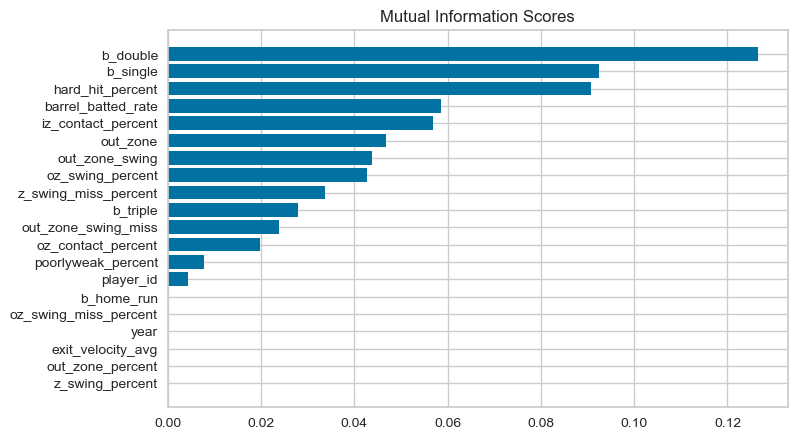

In [127]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

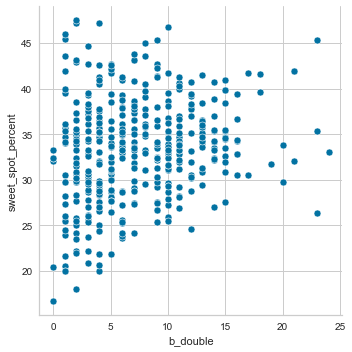

In [130]:
sns.relplot(x="b_double", y="sweet_spot_percent", data=df)

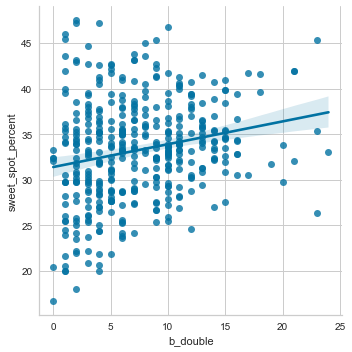

In [131]:
sns.lmplot(x="b_double", y="sweet_spot_percent", data=df)